# ATM and SnowSAR geo-processing example

In [1]:
#pyWavelet imports
from atm import atm
from snowradar import snowradar

#community imports
import os
import numpy as np
import matplotlib.pyplot as plt
import shapely
from shapely.geometry import MultiPolygon, MultiPoint, Point
from shapely.ops import cascaded_union, nearest_points
from descartes import PolygonPatch
from datetime import datetime
import pyproj as proj

import geopandas as gpd


C:\Users\kingj\AppData\Local\Continuum\anaconda3\envs\wavelet\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
import shapely.speedups
shapely.speedups.enable()

### Load snow radar meta data

In [3]:
radar_dir= "./data/eureka/sr"
radar_path = []
radar_file = []
for file in os.listdir(radar_dir):
    if file.endswith(".mat"):
        radar_path.append(os.path.join(radar_dir, file))
        radar_file.append(file)
radar_meta = [snowradar(fp, l_case='meta') for fp in radar_path]

In [3]:
radar_mpoly = MultiPolygon([x.poly for x in radar_meta])

Load atm meta data

In [4]:
atm_dir= "./data/eureka/atm"
atm_path = []
atm_file = []
for file in os.listdir(atm_dir):
    if file.endswith(".h5"):
        atm_path.append(os.path.join(atm_dir, file))
        atm_file.append(file)
atm_meta = [atm(fp, l_case='meta') for fp in atm_path]

In [5]:
atm_mpoly = MultiPolygon([x.poly for x in atm_meta])

### Plot ATM and SR extent

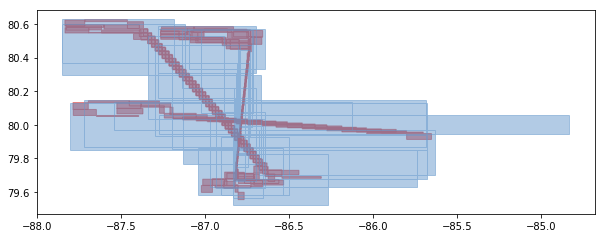

In [6]:
BLUE = '#6699cc'
RED = '#cc0a0a'
fig, ax = plt.subplots(figsize=(10,10))
ax = fig.gca() 
ax.add_patch(PolygonPatch(radar_mpoly, fc=RED, ec=RED, alpha=0.5, zorder=2 ))
ax.add_patch(PolygonPatch(atm_mpoly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2 ))
ax.axis('scaled')
plt.show()

## Check for intersections

In [7]:
radar_cur = snowradar(radar_meta[122].file_path, 'full')
radar_epoch = datetime.utcfromtimestamp(radar_cur.utc_time[0])
print(radar_epoch)

2016-04-19 14:27:46.143111


In [8]:
time_diff = np.asarray([(radar_epoch - x.file_epoch).total_seconds() for x in atm_meta])
atm_idx = time_diff[time_diff>0].argmin()
atm_meta[atm_idx].file_epoch

datetime.datetime(2016, 4, 19, 14, 21, 43)

In [12]:
atm_cur = atm(atm_meta[atm_idx].file_path, 'full')

In [13]:
atm_df = gpd.pd.DataFrame({"lat":atm_cur.lat,
                          "lon":atm_cur.lon, 
                          "elv":atm_cur.elv})
atm_geom = [Point(xy) for xy in zip(atm_df.lon, atm_df.lat)]
atm_df = atm_df.drop(['lat', 'lon'], axis=1)
crs = {'init': 'epsg:4326'}
atm_df = gpd.GeoDataFrame(atm_df, crs=crs, geometry=atm_geom)

In [14]:
atm_df.to_crs({'init': 'epsg:3413'})

,elv,geometry
0,7.020,POINT (-695726.196900532 -764828.7114318799)
1,7.131,POINT (-695724.8744098963 -764833.45240936)
2,7.091,POINT (-695723.6920152663 -764838.2133430069)
3,7.093,POINT (-695722.7364438073 -764843.0627593113)
4,6.918,POINT (-695721.994346084 -764848.0128029186)
5,6.995,POINT (-695721.5057692075 -764853.027047807)
6,7.057,POINT (-695721.2440149616 -764858.1297810435)
7,7.121,POINT (-695721.2224326553 -764863.3088616512)
8,7.065,POINT (-695721.3676461283 -764868.4836218922)
9,7.146,POINT (-695721.7797318209 -764873.7104466696)


In [16]:
atm_mask = atm_df.within(radar_cur.poly)

In [18]:
sum(atm_mask)

101728

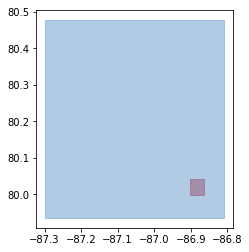

In [11]:
fig = plt.figure() 
ax = fig.gca() 
ax.add_patch(PolygonPatch(radar_cur.poly, fc=RED, ec=RED, alpha=0.5, zorder=2 ))
ax.add_patch(PolygonPatch(atm_cur.poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2 ))
ax.axis('scaled')
plt.show()

In [142]:
crs_from = proj.Proj(init='epsg:4326') # WGS 84
crs_to = proj.Proj(init='epsg:3413') # Polar stereo
r_x, r_y = proj.transform(crs_from, crs_to, radar_cur.lon, radar_cur.lat)
#r_list = np.column_stack((r_x,r_y)).tolist()

r_geom = [Point(xy) for xy in zip(r_x, r_y)]

#r_points = MultiPoint(list(zip(r_x,  r_x)))

#r_points = [Point(coords[0], coords[1]) for coords in r_list]
#r_buff = [rp.buffer(100) for rp in r_points]
#atm_cur.x, atm_cur.y = proj.transform(crs_from, crs_to, atm_cur.lon, atm_cur.lat)
#r_mpoly = MultiPolygon([x for x in r_buff])
#r_merged_poly = cascaded_union(r_buff)

In [126]:
#[p for p in list(r_points)]

In [143]:
a_x, a_y = proj.transform(crs_from, crs_to, atm_cur.lon, atm_cur.lat)
a_geom = [Point(xy) for xy in zip(a_x, a_y)]

#atm_coords = MultiPoint(list(zip(a_x,  a_y)))

#a_list = np.column_stack((a_x,a_y)).tolist()

#MultiPoint
#atm_valid = [r_merged_poly.contains(Point(a[0], a[1])) for a in a_list]


In [138]:
x = [r_buff[0].contains(x) for x in list(atm_coords)]

In [84]:
nearest_geoms = nearest_points(r_points[0], atm_coords)

In [137]:
list(x)

TypeError: 'bool' object is not iterable

In [87]:
print(nearest_geoms[0])

POINT (-722212.6312533275 -804837.844365074)


In [66]:
print(len(atm_cur.elv))
print(sum(atm_valid))

1364945
111329


In [91]:
t = r_points[0].distance(atm_coords)
print(t)

0.783501288291017


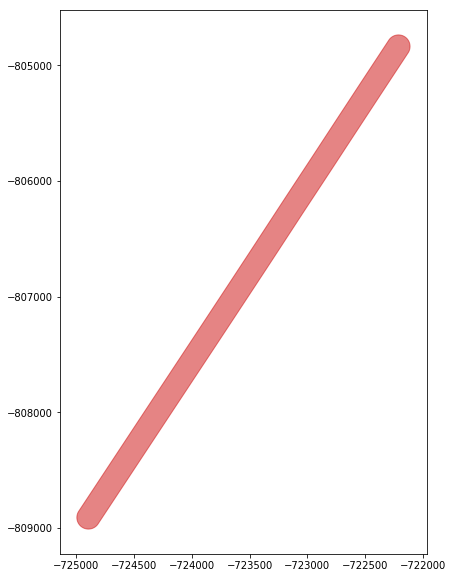

In [97]:
RED = '#cc0a0a'
fig, ax = plt.subplots(figsize=(10,10))
ax = fig.gca() 
ax.add_patch(PolygonPatch(r_merged_poly, fc=RED, ec=RED, alpha=0.5, zorder=2 ))
ax.axis('scaled')
plt.show()

In [93]:
r_merged_poly.contains(atm_coords)

False

In [98]:

p = r_merged_poly.intersection(atm_coords)


In [99]:
p

In [100]:
print(p)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



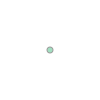

In [104]:
p[199]

In [105]:
x = atm_coords.intersection(r_merged_poly)

In [106]:
type(x)

shapely.geometry.multipoint.MultiPoint

In [112]:
len(list(x))

111317